In [60]:
import pandas as pd
import numpy as np
from tqdm import tqdm
import scipy.stats

import matplotlib.pyplot as plt
#import seaborn as sns
import librosa
import librosa.display
from IPython.display import Audio

from pathlib import Path
import sys
import os
import warnings
# suppress all warnings
warnings.filterwarnings("ignore")

from multiprocessing import Pool, cpu_count

In [3]:
class cfg:
    # random seed
    seed = 42

    # audio clip settings
    sr = 22050
    duration = 15 # the duration of the clips
    
    n_samples = duration*sr
    
    hop_length = 2048 # "stepsize" of the fft for the melspectrograms
    nfft = 4096 # windowsize of the fft for the melspectrograms
    n_mels = 128 # number of mel frequency bins
    fmax = sr/2 # maximum frequency in the melspectrograms
    input_dim = (n_mels, int(duration*sr//hop_length + 1))

## Compute audio features

In [41]:
n_mfcc = 10

feature_names = [
    'zcr',
    'rms',
    'spectral_centroid',
    'spectral_bandwidth',
    'spectral_flatness',
    'spectral_rolloff',
    'mean',
    'std_dev',
    'skewness',
    'kurtosis'
] + [f'mfcc_{i+1}' for i in range(n_mfcc)
] + [f'spectral_contrast{i+1}' for i in range(7)
] + [f'chroma{i+1}' for i in range(12)
] + [f'tonnetz{i+1}' for i in range(6)]

In [42]:
df = pd.read_csv("../../data/dataset10.csv")

In [66]:
unique_species = sorted(df['en'].unique())

# Create a mapping from species to labels
species_to_label = {species: idx for idx, species in enumerate(unique_species)}

# Map the species to labels and create the new column
df['label'] = df['en'].map(species_to_label)

In [15]:
y, sr = librosa.load(df.loc[0, "fullfilename"])
chroma = librosa.feature.chroma_stft(y=y, sr=sr)
tonnetz = librosa.feature.tonnetz(y=y, sr=sr)
zcr = np.mean(librosa.feature.zero_crossing_rate(y))
rms = np.mean(librosa.feature.rms(y=y))

    # Frequency-domain features
spectral_centroid = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
spectral_bandwidth = librosa.feature.spectral_bandwidth(y=y, sr=sr)
spectral_contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
spectral_flatness = librosa.feature.spectral_flatness(y=y)
spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)

In [52]:
def compute_features(df, i):
    # Load audio file
    y, sr = librosa.load(df.loc[i, "fullfilename"])

    # Time-domain features
    df.loc[i, "zcr"] = np.mean(librosa.feature.zero_crossing_rate(y))
    df.loc[i, "rms"] = np.mean(librosa.feature.rms(y=y))

    # Frequency-domain features
    df.loc[i, "spectral_centroid"] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    df.loc[i, "spectral_bandwidth"] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr), axis = 1)
    for k in range(7):
        df.loc[i, f"spectral_contrast{k+1}"] = spectral_contrast[k]
    df.loc[i, "spectral_flatness"] = np.mean(librosa.feature.spectral_flatness(y=y))
    df.loc[i, "spectral_rolloff"] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))

    # Cepstral features
    mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr), axis=1)[:n_mfcc]
    for j in range(n_mfcc):
        df.loc[i, f"mfcc_{j+1}"] = mfccs[j]

    # Tonnetz
    tonnetz = np.mean(librosa.feature.tonnetz(y=y, sr=sr), axis = 1)
    for k in range(6):
        df.loc[i, f"tonnetz{k+1}"] = tonnetz[k]

    # Chroma
    chroma = np.mean(librosa.feature.chroma_stft(y=y, sr=sr), axis = 1)
    for k in range(12):
        df.loc[i, f"chroma{k+1}"] = chroma[k]
        
    # Statistical features
    df.loc[i, "mean"] = np.mean(y)
    df.loc[i, "std_dev"] = np.std(y)
    df.loc[i, "skewness"] = scipy.stats.skew(y)
    df.loc[i, "kurtosis"] = scipy.stats.kurtosis(y)

In [53]:
for feature in feature_names:
    df[feature] = float(-np.inf)

In [54]:
for i in tqdm(range(20)):
    compute_features(df, i) 

100%|███████████████████████████████████████████████████████████████████████████████████| 20/20 [03:09<00:00,  9.47s/it]


In [61]:
# Number of MFCCs to compute
n_mfcc = 10

# Feature names for the DataFrame
feature_names = (
    [
        'zcr',
        'rms',
        'spectral_centroid',
        'spectral_bandwidth',
        'spectral_flatness',
        'spectral_rolloff',
        'mean',
        'std_dev',
        'skewness',
        'kurtosis'
    ]
    + [f'mfcc_{i+1}' for i in range(n_mfcc)]
    + [f'spectral_contrast{i+1}' for i in range(7)]
    + [f'chroma{i+1}' for i in range(12)]
    + [f'tonnetz{i+1}' for i in range(6)]
)

def compute_features(row):
    # Load audio file
    y, sr = librosa.load(row["fullfilename"])
    
    features = {}
    
    # Time-domain features
    features["zcr"] = np.mean(librosa.feature.zero_crossing_rate(y))
    features["rms"] = np.mean(librosa.feature.rms(y=y))

    # Frequency-domain features
    features["spectral_centroid"] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
    features["spectral_bandwidth"] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
    
    spectral_contrast = np.mean(librosa.feature.spectral_contrast(y=y, sr=sr), axis=1)
    for k in range(7):
        features[f"spectral_contrast{k+1}"] = spectral_contrast[k]

    features["spectral_flatness"] = np.mean(librosa.feature.spectral_flatness(y=y))
    features["spectral_rolloff"] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))

    # Cepstral features
    mfccs = np.mean(librosa.feature.mfcc(y=y, sr=sr), axis=1)[:n_mfcc]
    for j in range(n_mfcc):
        features[f"mfcc_{j+1}"] = mfccs[j]

    # Tonnetz
    tonnetz = np.mean(librosa.feature.tonnetz(y=y, sr=sr), axis=1)
    for k in range(6):
        features[f"tonnetz{k+1}"] = tonnetz[k]

    # Chroma
    chroma = np.mean(librosa.feature.chroma_stft(y=y, sr=sr), axis=1)
    for k in range(12):
        features[f"chroma{k+1}"] = chroma[k]
    
    # Statistical features
    features["mean"] = np.mean(y)
    features["std_dev"] = np.std(y)
    features["skewness"] = scipy.stats.skew(y)
    features["kurtosis"] = scipy.stats.kurtosis(y)

    return features

def parallel_feature_extraction(df):
    # Use all available CPU cores
    num_cores = cpu_count()

    # Initialize a pool of workers
    with Pool(processes=num_cores) as pool:
        # Use tqdm to visualize progress
        results = list(tqdm(pool.imap(compute_features, [row for _, row in df.iterrows()]), total=len(df)))
    
    # Create a new DataFrame with the features
    feature_df = pd.DataFrame(results, index=df.index)
    
    # Concatenate with original DataFrame
    df = pd.concat([df, feature_df], axis=1)
    
    return df

In [62]:
# Assuming df is your DataFrame with filenames
df['features'] = None
df = parallel_feature_extraction(df)

 18%|██████████████▍                                                                   | 53/300 [02:51<10:28,  2.54s/it]Note: Illegal Audio-MPEG-Header 0x50455441 at offset 5793876.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 43%|██████████████████████████████████▌                                              | 128/300 [06:18<07:22,  2.57s/it]Note: Illegal Audio-MPEG-Header 0x50455441 at offset 10021533.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 67%|██████████████████████████████████████████████████████▌                          | 202/300 [09:38<06:28,  3.96s/it]Note: Illegal Audio-MPEG-Header 0x50455441 at offset 10036161.
Note: Trying to resync...
Note: Hit end of (available) data during resync.
 85%|████████████████████████████████████████████████████████████████████▌            | 254/300 [11:51<02:10,  2.83s/it]Note: Illegal Audio-MPEG-Header 0x6c202f2f at offset 4234262.
Note: Trying to resync...
Note: Hit end of (a

In [ ]:
# Unpack features into separate columns
df[feature_names] = pd.DataFrame(df['features'].tolist(), index=df.index)
df.drop(columns=['features'], inplace=True)

# Display the resulting DataFrame
print(df.head())

In [68]:
df.to_csv("../../data/dataset10_features.csv", index = False)
#df = pd.read_csv("../../data/dataset10_features.csv")

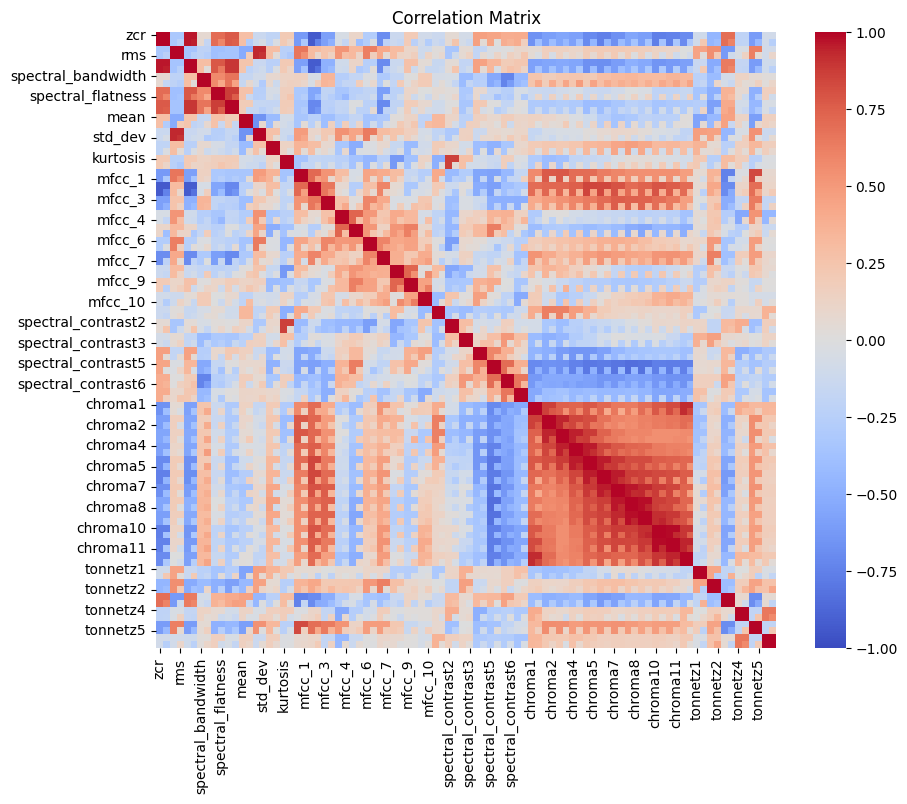

In [69]:
import seaborn as sns
corr_matrix = df[feature_names].corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, fmt='.2f', cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

## Different scaling approaches

## No scaling

In [64]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from pandas.plotting import scatter_matrix

def evaluate_knn(df):
    scatter_matrix(df[feature_names], c=df.label, alpha=0.8, figsize=(30, 30), s=20);
    plt.show()
    df_train, df_test = train_test_split(df, test_size = 0.2, random_state = 42)
    print("# Neighbors \t Accuracy")
    for i in range(1,16):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(df_train[feature_names], df_train.label)
        preds = knn.predict(df_test[feature_names])
        print(f"{i} \t\t {len(preds[preds == df_test.label])/len(preds)*100:.2f} %")

In [67]:
evaluate_knn(df)

ValueError: supplied range of [-inf, 0.4796630429802053] is not finite

Error in callback <function _draw_all_if_interactive at 0x7fee4a994700> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7fee55be1e50> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

## With scaling

In [70]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import QuantileTransformer

### MinMaxScaler

In [16]:
minmax = MinMaxScaler()
df_minmax = df.copy()
df_minmax[feature_names] = pd.DataFrame(minmax.fit_transform(X = df_minmax[feature_names]), columns=feature_names)

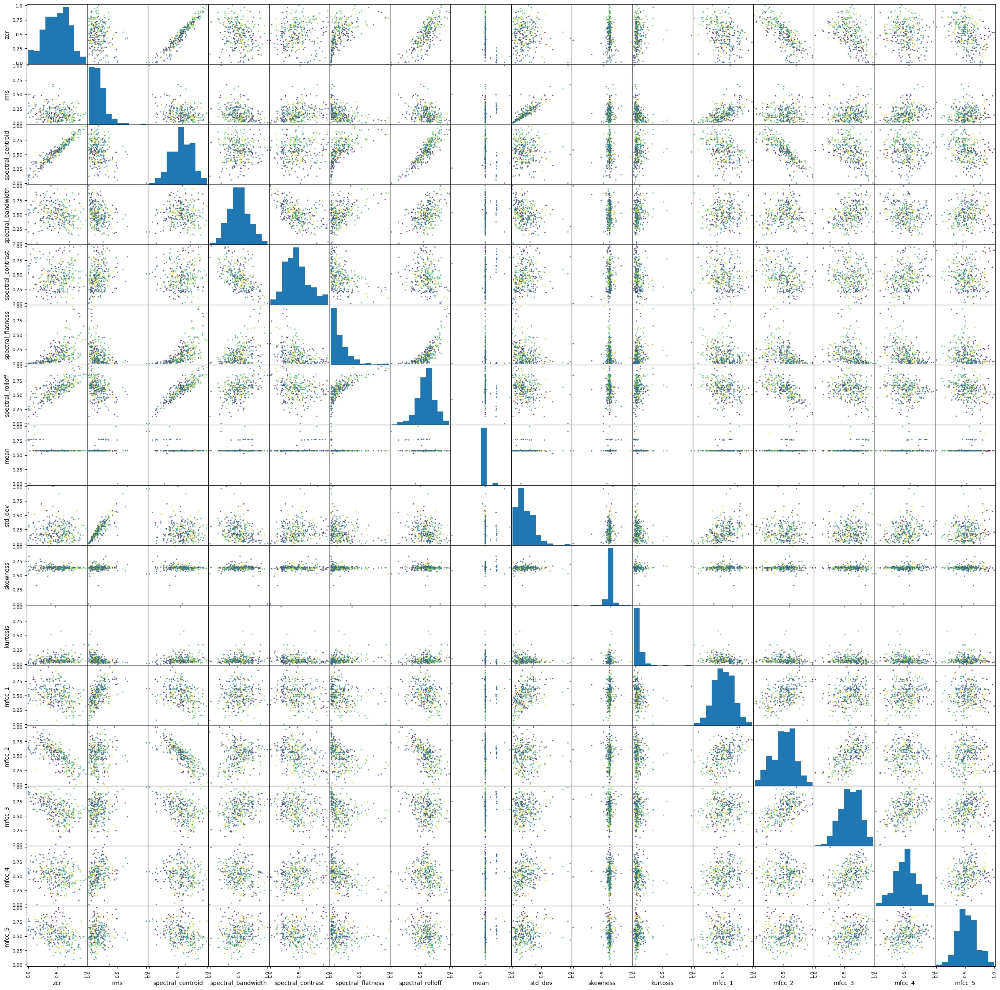

# Neighbors 	 Accuracy
1 		 26.67 %
2 		 23.33 %
3 		 26.67 %
4 		 20.00 %
5 		 18.33 %
6 		 21.67 %
7 		 23.33 %
8 		 26.67 %
9 		 30.00 %
10 		 28.33 %
11 		 28.33 %
12 		 26.67 %
13 		 21.67 %
14 		 23.33 %
15 		 21.67 %


In [17]:
evaluate_knn(df_minmax)

### StandardScaler

In [71]:
standard = StandardScaler()
df_std = df.copy()
df_std[feature_names] = pd.DataFrame(standard.fit_transform(X = df_std[feature_names]), columns=feature_names)

ValueError: Input X contains infinity or a value too large for dtype('float64').

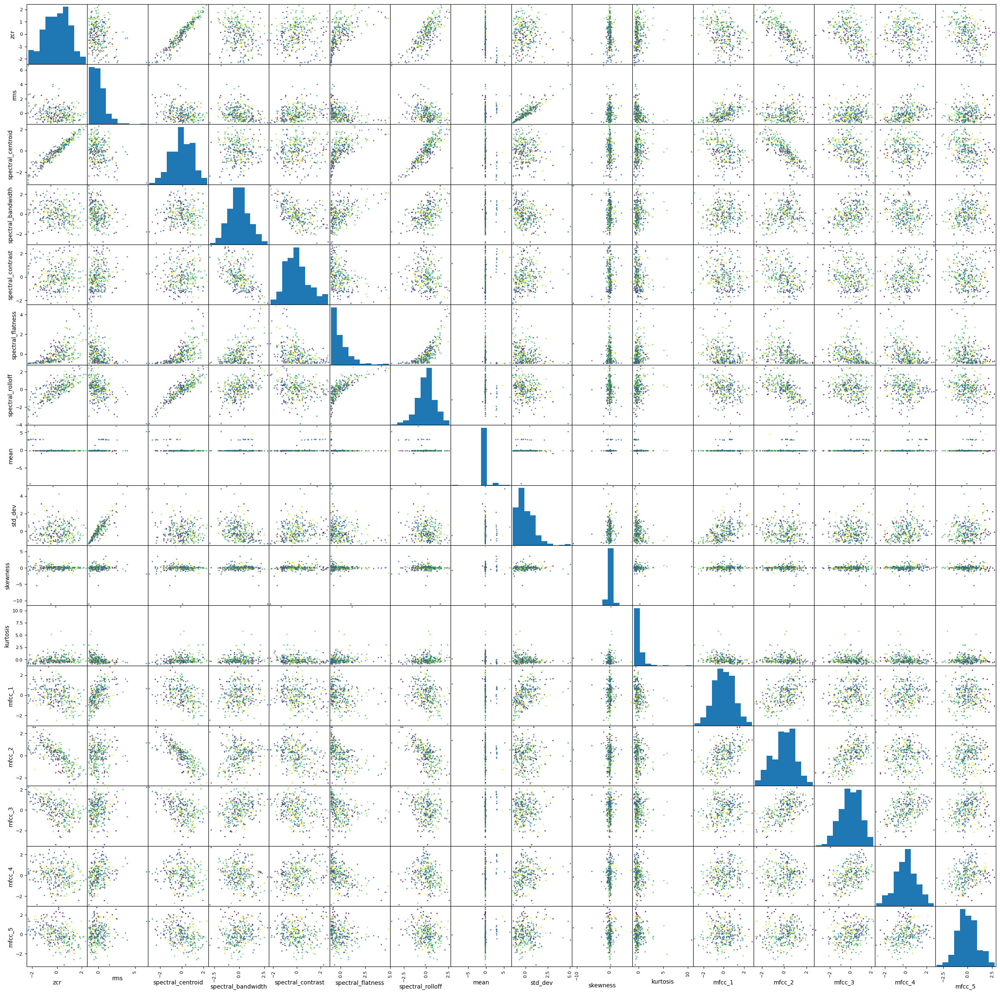

# Neighbors 	 Accuracy
1 		 35.00 %
2 		 25.00 %
3 		 25.00 %
4 		 23.33 %
5 		 21.67 %
6 		 25.00 %
7 		 28.33 %
8 		 21.67 %
9 		 20.00 %
10 		 18.33 %
11 		 23.33 %
12 		 21.67 %
13 		 21.67 %
14 		 25.00 %
15 		 23.33 %


In [25]:
evaluate_knn(df_std)

### RobustScaler

In [26]:
robust = RobustScaler()
df_robust = df.copy()
df_robust[feature_names] = pd.DataFrame(robust.fit_transform(X = df_robust[feature_names]), columns=feature_names)

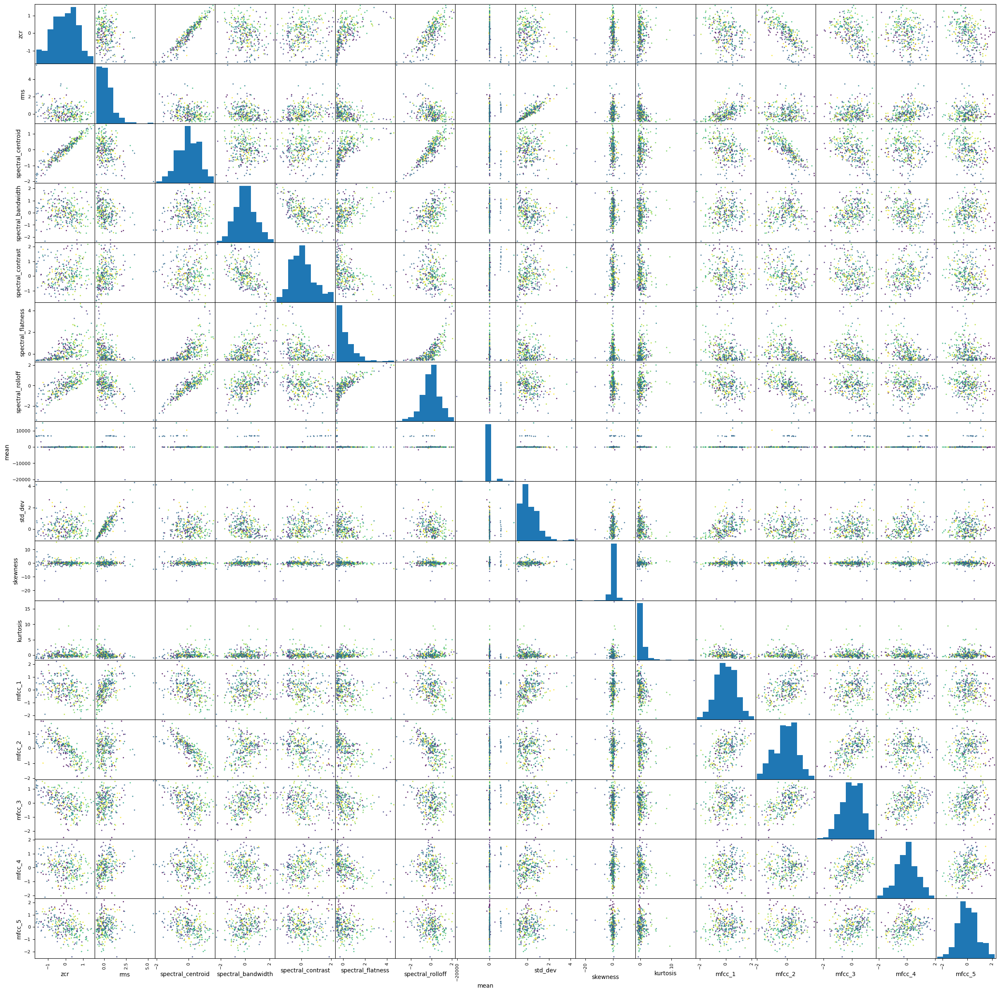

# Neighbors 	 Accuracy
1 		 33.33 %
2 		 20.00 %
3 		 20.00 %
4 		 21.67 %
5 		 28.33 %
6 		 25.00 %
7 		 23.33 %
8 		 26.67 %
9 		 25.00 %
10 		 25.00 %
11 		 28.33 %
12 		 28.33 %
13 		 28.33 %
14 		 26.67 %
15 		 25.00 %


In [27]:
evaluate_knn(df_robust)

### Normalizer

In [28]:
normalizer = Normalizer()
df_norm = df.copy()
df_norm[feature_names] = pd.DataFrame(normalizer.fit_transform(X = df_norm[feature_names]), columns=feature_names)

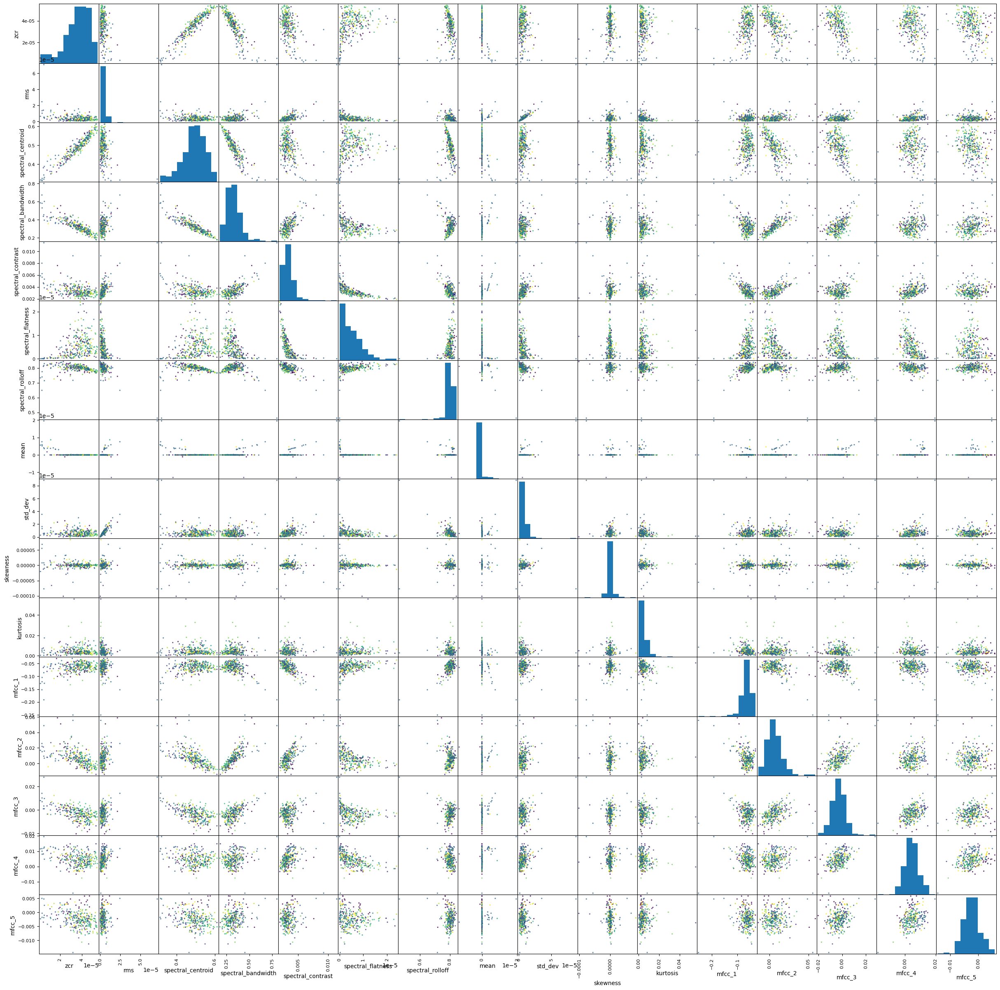

# Neighbors 	 Accuracy
1 		 13.33 %
2 		 15.00 %
3 		 13.33 %
4 		 18.33 %
5 		 20.00 %
6 		 20.00 %
7 		 16.67 %
8 		 15.00 %
9 		 18.33 %
10 		 20.00 %
11 		 21.67 %
12 		 21.67 %
13 		 21.67 %
14 		 16.67 %
15 		 18.33 %


In [29]:
evaluate_knn(df_norm)

### QuantileTransformer

In [32]:
quant = QuantileTransformer(output_distribution='normal')
df_quant = df.copy()
df_quant[feature_names] = pd.DataFrame(quant.fit_transform(X = df_quant[feature_names]), columns=feature_names)

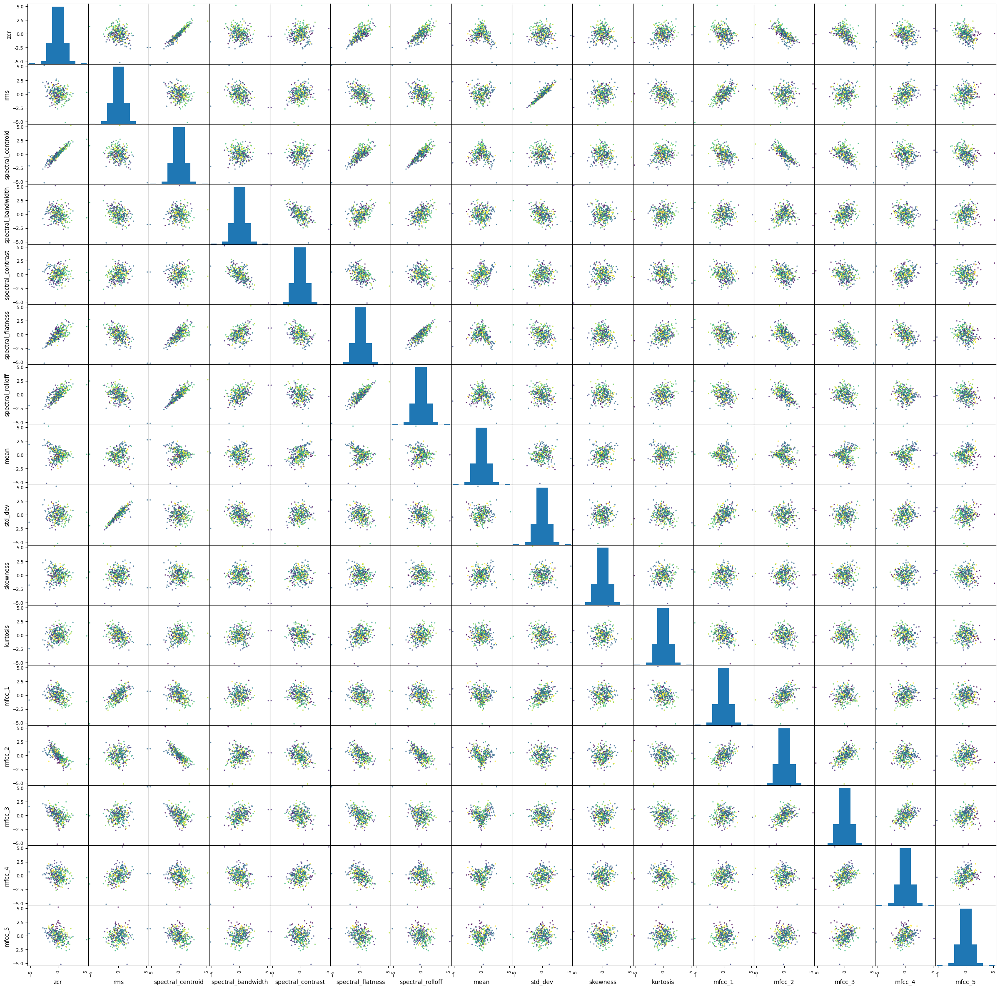

# Neighbors 	 Accuracy
1 		 33.33 %
2 		 21.67 %
3 		 23.33 %
4 		 25.00 %
5 		 23.33 %
6 		 21.67 %
7 		 20.00 %
8 		 18.33 %
9 		 20.00 %
10 		 21.67 %
11 		 21.67 %
12 		 20.00 %
13 		 18.33 %
14 		 16.67 %
15 		 20.00 %


In [33]:
evaluate_knn(df_quant)

## Principal Component Analysis

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=15)  # Retain 95% of the variance
principal_components = pca.fit_transform(df_std[feature_names])

In [ ]:
# Check the shape of the transformed data
print(principal_components.shape)

# Plot the explained variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Number of Components')
plt.grid()
plt.show()

In [ ]:
def evaluate_pca(pca):
    scatter_matrix(pca, c=df.label, alpha=0.8, figsize=(30, 30), s=20);
    plt.show()
    X_train, X_test, y_train, y_test = train_test_split(pca, df.label, test_size=0.2, random_state=42)
    print("# Neighbors \t Accuracy")
    for i in range(1,16):
        knn = KNeighborsClassifier(n_neighbors=i)
        knn.fit(X_train, y_train)
        preds = knn.predict(X_test)
        print(f"{i} \t\t {len(preds[preds == y_test])/len(preds)*100:.2f} %")

In [ ]:
df_pca = pd.DataFrame(principal_components)
evaluate_pca(df_pca)